### Importing Libs

In [66]:
# Importing Libs

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

sns.set_theme(style="darkgrid", rc={'figure.figsize':(12,6)})

### Creating DataFrames

Inicialmente, serão criados os datasets com os dados disponibilizados pela Olist:

In [70]:
# Defining datasets paths

CUSTOMERS_PATH = r"datasets/olist_customers_dataset.csv"
GEOLOCATION_PATH = r"datasets/olist_geolocation_dataset.csv"
ORDER_ITEM_PATH = r"datasets/olist_order_items_dataset.csv"
ORDER_PAYMENTS_PATH = r"datasets/olist_order_payments_dataset.csv"
ORDER_REVIEWS_PATH = r"datasets/olist_order_reviews_dataset.csv"
ORDERS_PATH = r"datasets/olist_orders_dataset.csv"
PRODUCTS_PATH = r"datasets/olist_products_dataset.csv"
SELLERS_PATH = r"datasets/olist_sellers_dataset.csv"
PROD_CATEG_PATH = r"datasets/product_category_name_translation.csv"

In [72]:
# DataFrames

df_customers = pd.read_csv(CUSTOMERS_PATH)
df_geoloc = pd.read_csv(GEOLOCATION_PATH)
df_order_item = pd.read_csv(ORDER_ITEM_PATH)
df_order_pay = pd.read_csv(ORDER_PAYMENTS_PATH)
df_order_rev = pd.read_csv(ORDER_REVIEWS_PATH)
df_orders = pd.read_csv(ORDERS_PATH)
df_product = pd.read_csv(PRODUCTS_PATH)
df_seller = pd.read_csv(SELLERS_PATH)
df_prod_cat = pd.read_csv(PROD_CATEG_PATH)

A partir dos DataFrames, será obtido um DataFrame utilizado para o EDA através do método `merge`:

In [74]:
# Merging DataFrames

# Merge Customer ID + Order ID
df_customer_orders = pd.merge(df_customers, df_orders, on='customer_id')

# Merge Customer ID + Order ID + Seller ID
df_customer_orders_seller = pd.merge(df_customer_orders, df_order_item, on='order_id')

# Merge Customer ID + Order ID + Seller ID + State Seller
df_cust_ord_sel_state = pd.merge(df_customer_orders_seller, df_seller, on='seller_id')

# Merge Customer ID + Order ID + Seller ID + State Seller + Paymen Type
df_cust_ord_sel_state = pd.merge(df_cust_ord_sel_state, df_order_pay, on='order_id')

# Merge Customer ID + Order ID + Seller ID + State Seller + paymenttype + Produt Category
df_eda = pd.merge(df_cust_ord_sel_state, df_product, on='product_id')

## Data Cleaning and Exploration

Abaixo, serão visualizadas as features que obtemos por meio do método `info()`, assim como os tipos:

In [77]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117601 entries, 0 to 117600
Data columns (total 33 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    117601 non-null  object 
 1   customer_unique_id             117601 non-null  object 
 2   customer_zip_code_prefix       117601 non-null  int64  
 3   customer_city                  117601 non-null  object 
 4   customer_state                 117601 non-null  object 
 5   order_id                       117601 non-null  object 
 6   order_status                   117601 non-null  object 
 7   order_purchase_timestamp       117601 non-null  object 
 8   order_approved_at              117586 non-null  object 
 9   order_delivered_carrier_date   116356 non-null  object 
 10  order_delivered_customer_date  115034 non-null  object 
 11  order_estimated_delivery_date  117601 non-null  object 
 12  order_item_id                 

Existem 6 atributos referentes a datas,e terão seus tpos covertidos de `object` para `datetime64`, facilitando operações posterirores envolvendo tempo e datas:

In [79]:
df_eda['order_purchase_timestamp'] = pd.to_datetime(df_eda['order_purchase_timestamp'])
df_eda['order_approved_at'] = pd.to_datetime(df_eda['order_approved_at'])
df_eda['order_delivered_carrier_date'] = pd.to_datetime(df_eda['order_delivered_carrier_date'])
df_eda['order_delivered_customer_date'] = pd.to_datetime(df_eda['order_delivered_customer_date'])
df_eda['order_estimated_delivery_date'] = pd.to_datetime(df_eda['order_estimated_delivery_date'])
df_eda['shipping_limit_date'] = pd.to_datetime(df_eda['shipping_limit_date'])

Serão então removidas as features que não serão utilizadas nas análises, e adicionadas features a respeito de meses e anos:

In [81]:
df_eda['month_order'] = df_eda['order_purchase_timestamp'].dt.strftime("%B")
df_eda['month_order_n'] = df_eda['order_purchase_timestamp'].dt.strftime("%m")
df_eda['year_order'] = df_eda['order_purchase_timestamp'].dt.strftime("%Y")

df_eda.drop(['product_name_lenght', 'product_description_lenght',
             'product_photos_qty', 'product_weight_g',
             'product_length_cm', 'product_height_cm',
             'product_width_cm'], axis=1, inplace=True)

Após isso, veremos quantos valores nulos temos em cada feature:

In [83]:
df_eda.isnull().sum()

customer_id                         0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
order_id                            0
order_status                        0
order_purchase_timestamp            0
order_approved_at                  15
order_delivered_carrier_date     1245
order_delivered_customer_date    2567
order_estimated_delivery_date       0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
seller_zip_code_prefix              0
seller_city                         0
seller_state                        0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
product_category_name            1698
month_order 

Boa partedos valores nulos encontrados são relativos aos tempos de entrega do produto.

Em uma primeira tentativa de filtrar isso, iremos ver como se comporta os valores da feature `order_status`, informando se o produto foi ou não entregue:

In [85]:
df_status = df_eda['order_status'].value_counts().reset_index() # Count values of each status and create a new DataFrame
df_status.columns = ["order_status", "count_status"] # Rename Columns
df_status['pct'] = round((100*df_status["count_status"]/df_status["count_status"].sum()),3).astype(str) + '%' # Add new column with percentages of status
df_status.sort_values("count_status", ascending=False, inplace = True)
df_status

,order_status,count_status,pct
0,delivered,115035,97.818%
1,shipped,1244,1.058%
2,canceled,566,0.481%
3,processing,375,0.319%
4,invoiced,371,0.315%
5,unavailable,7,0.006%
6,approved,3,0.003%


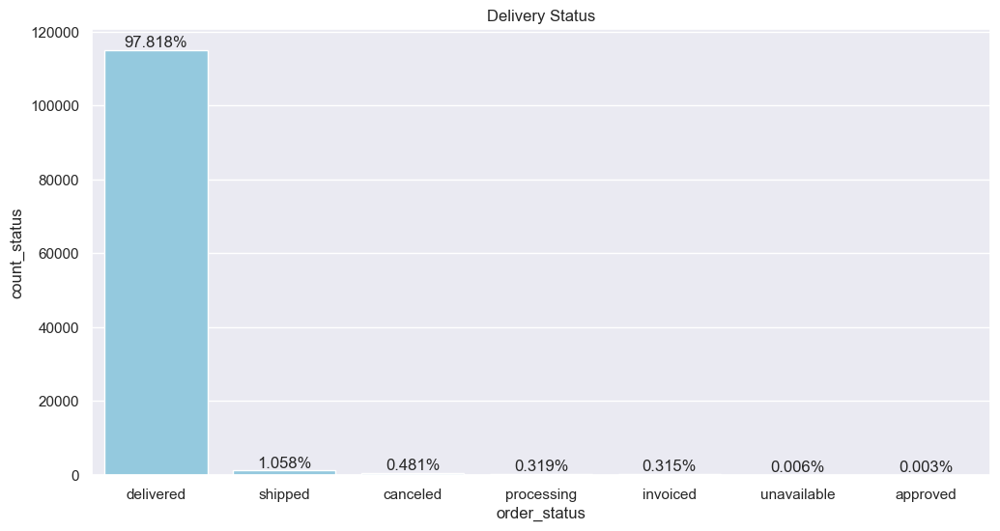

In [86]:
ax = sns.barplot(data = df_status, y='count_status', x="order_status", errorbar=None, color='skyblue')
bars = ax.containers[0]
ax.bar_label(bars, labels = df_status["pct"])
ax.set_title('Delivery Status');

Observamos então, que mais de 97% dos pedidos obtiveram o status `delivered`, ou seja, foram corretaemntes entregues. Então, para as análises que iremos fazer agora, utilizaremos apenas os quais foram entregues, ou seja, `order_status = delivered`

In [89]:
df_delivered = df_eda[df_eda['order_status']== 'delivered']
df_delivered.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,seller_city,seller_state,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,month_order,month_order_n,year_order
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,itaquaquecetuba,SP,1,credit_card,2,146.87,moveis_escritorio,May,05,2017
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,...,itajai,SC,1,credit_card,8,335.48,utilidades_domesticas,January,01,2018
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,...,itaquaquecetuba,SP,1,credit_card,7,157.73,moveis_escritorio,May,05,2018
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,...,itaquaquecetuba,SP,1,credit_card,1,173.30,moveis_escritorio,March,03,2018
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,...,ibitinga,SP,1,credit_card,8,252.25,casa_conforto,July,07,2018


Novamente, iremos ver quantos valores nulos temos:

In [93]:
df_delivered.isnull().sum()

customer_id                         0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
order_id                            0
order_status                        0
order_purchase_timestamp            0
order_approved_at                  15
order_delivered_carrier_date        2
order_delivered_customer_date       8
order_estimated_delivery_date       0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
seller_zip_code_prefix              0
seller_city                         0
seller_state                        0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
product_category_name            1628
month_order 

In [95]:
df_delivered.shape

(115035, 29)

Como faremos uam análise sobre os tempos de entrega, serão removidos os valores nulos correspondentes a isso. Quanto as valores nulos a respeito da categoria do produto (`product_category_name`), estes não irão causar problemas às análises posteriores, e por isso não serão removidos:

In [97]:
df_delivered = df_delivered.dropna(subset=['order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date'])

In [98]:
df_delivered.isnull().sum()

customer_id                         0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
order_id                            0
order_status                        0
order_purchase_timestamp            0
order_approved_at                   0
order_delivered_carrier_date        0
order_delivered_customer_date       0
order_estimated_delivery_date       0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
seller_zip_code_prefix              0
seller_city                         0
seller_state                        0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
product_category_name            1627
month_order 

In [99]:
df_delivered.shape

(115011, 29)

Antes de iniciarmos nossa análise, é interessante ver o primeiro e último momenot que foram feitos pedidos:

In [101]:
min_order = df_eda['order_purchase_timestamp'].min()
max_order = df_eda['order_purchase_timestamp'].max()

print("The first order was made at {} and the last one was made at {}".format(min_order, max_order))

The first order was made at 2016-09-04 21:15:19 and the last one was made at 2018-09-03 09:06:57


## 1. Introdução

### Objetivo da análise

### Breve descrição dos dados

## 2. Análise Geográfica

### 2.1 Quantidade por Estado

#### Vendas por estado (quantidade)

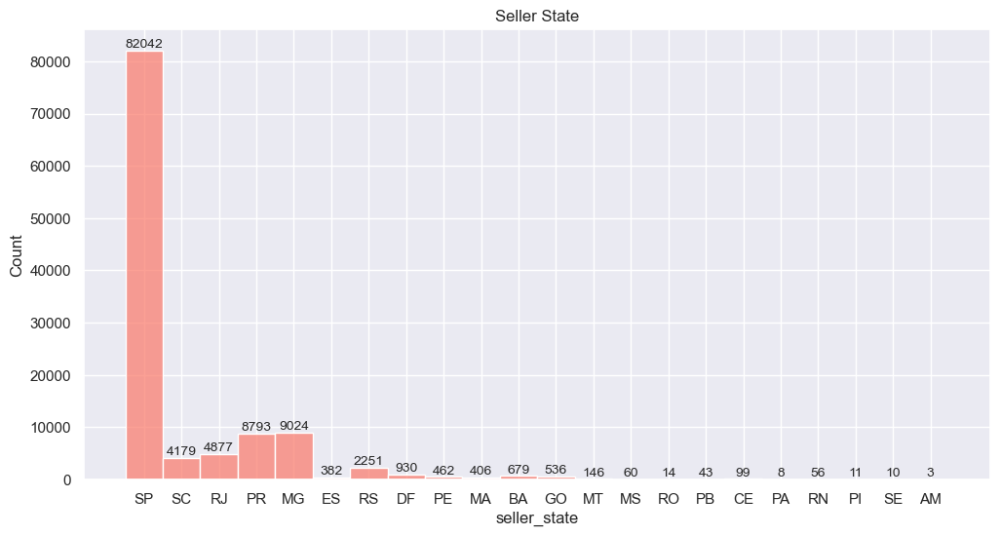

In [113]:
ax = sns.histplot(df_delivered['seller_state'], kde=False, color='salmon')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set(title='Seller State');

#### Compras por estado (quantidade)

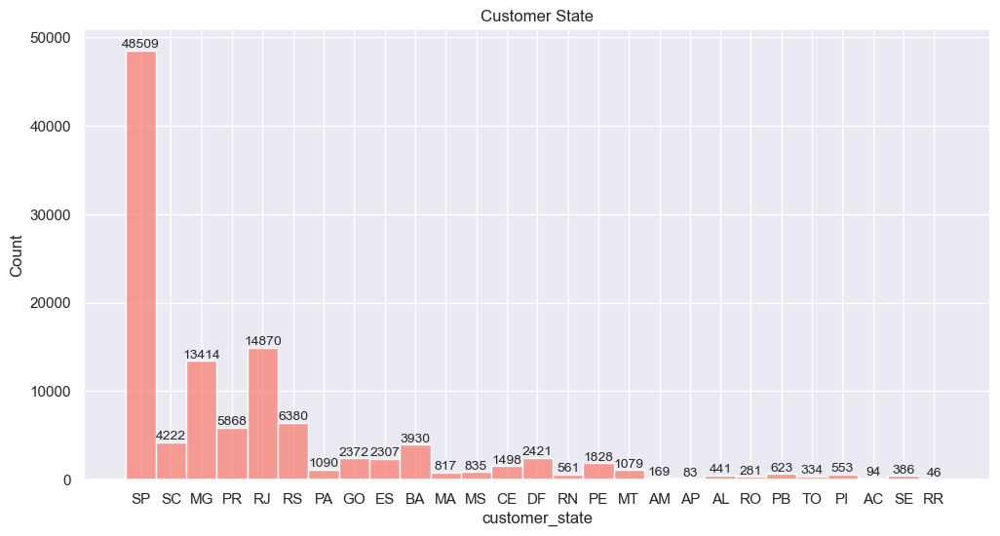

In [116]:
ax = sns.histplot(df_delivered['customer_state'], kde=False, color='salmon')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('Customer State');

#### Clientes por estado (quantidade)

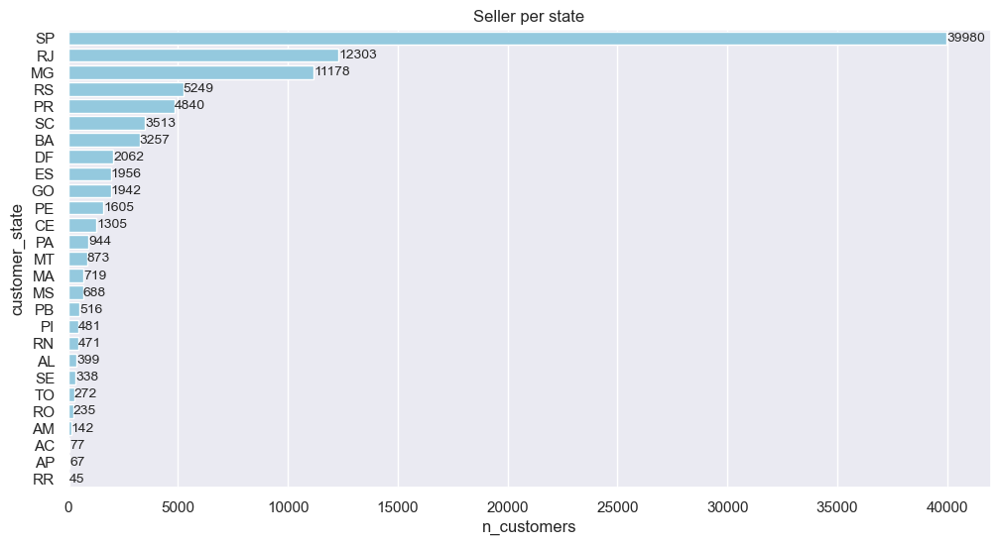

In [119]:
seller_per_state = df_eda.groupby("customer_state")["customer_unique_id"].nunique().reset_index()
seller_per_state.columns = ["customer_state", "n_customers"]
seller_per_state.sort_values("n_customers", ascending=False, inplace = True)

ax = sns.barplot(data = seller_per_state, y='customer_state', x="n_customers", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
# ax.tick_params(axis='x', rotation=90)
ax.set_title('Seller per state');

#### Vendedores por estado (quantidade)

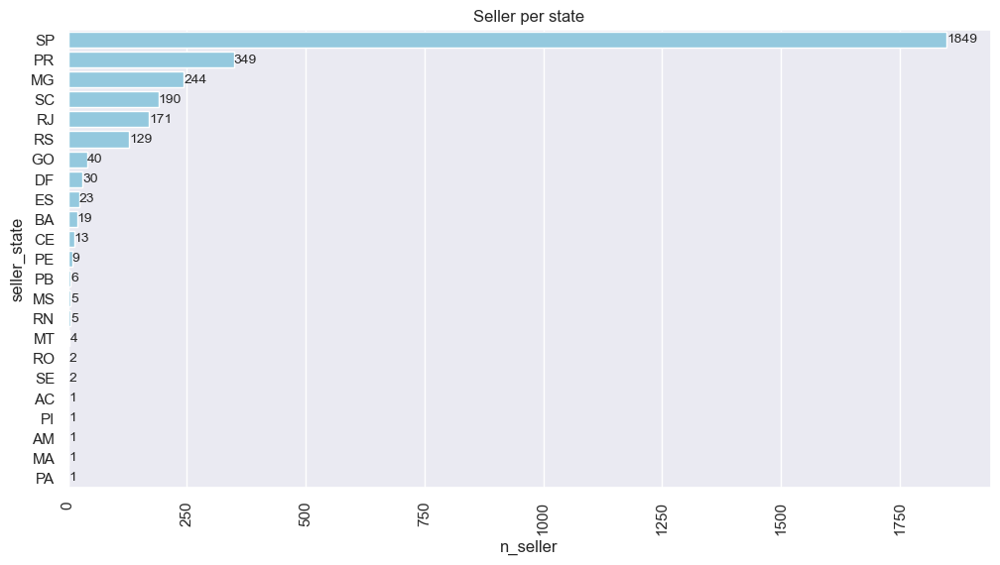

In [124]:
seller_per_state = df_eda.groupby("seller_state")["seller_id"].nunique().reset_index()
seller_per_state.columns = ["seller_state", "n_seller"]
seller_per_state.sort_values("n_seller", ascending=False, inplace = True)

ax = sns.barplot(data = seller_per_state, y='seller_state', x="n_seller", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.tick_params(axis='x', rotation=90)
ax.set_title('Seller per state');

### 2.2 Receita e Custos por Estado

#### Vendas por estado (valor total)

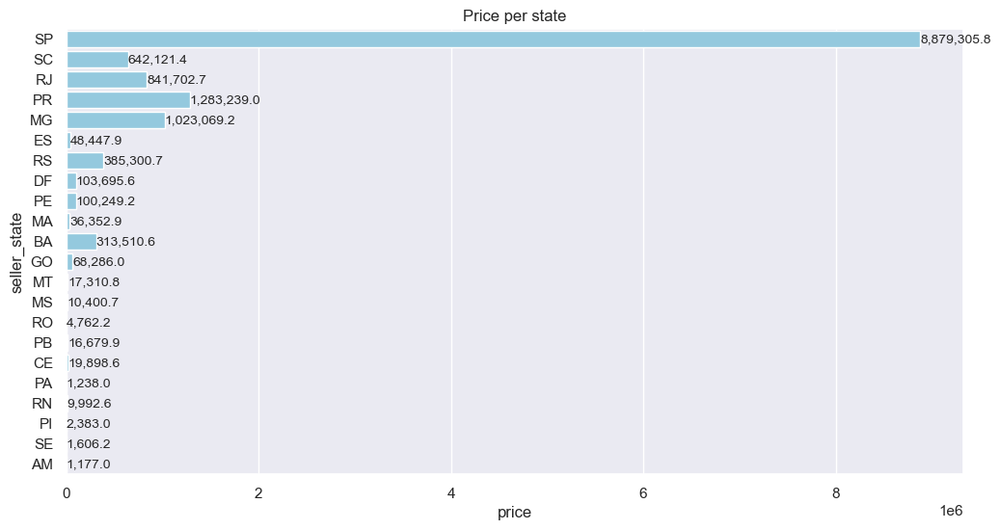

In [127]:
ax = sns.barplot(df_delivered, y="seller_state", x="price", estimator="sum", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10, fmt='{:,.1f}'); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('Price per state');

#### Compras por estado (valor total)

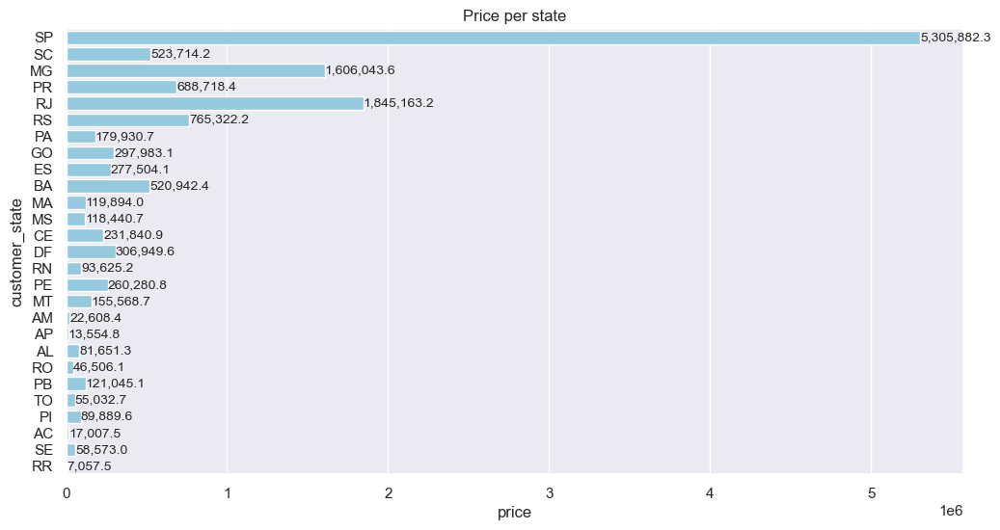

In [129]:
ax = sns.barplot(df_delivered, y="customer_state", x="price", estimator="sum", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10, fmt='{:,.1f}'); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('Price per state');

#### Frete por estado (soma total)

In [131]:
df_freight_state = df_eda.groupby(['customer_state']).agg(sum_price = ('freight_value', 'sum'), mean_price = ('freight_value', 'mean')).reset_index()
df_freight_state.sort_values(by=['sum_price'], ascending = False, inplace = True)
df_freight_state['mean_price'] = df_freight_state['mean_price'].round(2)
df_freight_state

,customer_state,sum_price,mean_price
25,SP,753351.18,15.20
18,RJ,323413.95,21.10
10,MG,281301.31,20.63
22,RS,141579.69,21.83
17,PR,122669.69,20.58
4,BA,106538.62,26.32
23,SC,92216.36,21.44
15,PE,61923.56,32.78
8,GO,55237.53,22.73
6,DF,52118.84,21.08


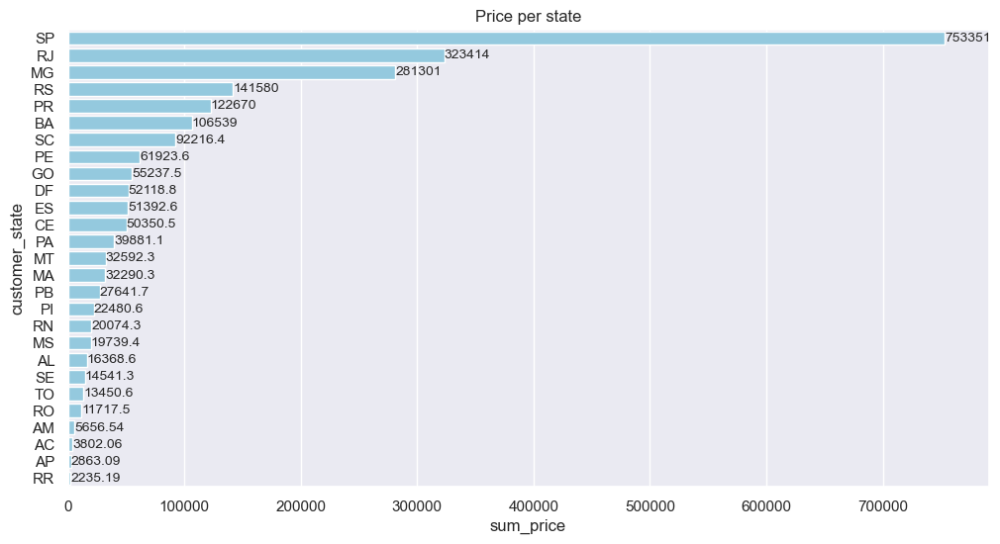

In [133]:
ax = sns.barplot(df_freight_state, y="customer_state", x="sum_price", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10); 
ax.set_title('Price per state');

#### Frete por estado (média)

In [137]:
df_freight_state.sort_values(by=['mean_price'], ascending = False, inplace = True)
df_freight_state

,customer_state,sum_price,mean_price
14,PB,27641.72,43.26
21,RR,2235.19,42.98
20,RO,11717.47,40.97
0,AC,3802.06,40.02
26,TO,13450.60,39.68
16,PI,22480.64,39.23
9,MA,32290.33,38.26
24,SE,14541.29,36.63
1,AL,16368.65,35.74
13,PA,39881.05,35.74


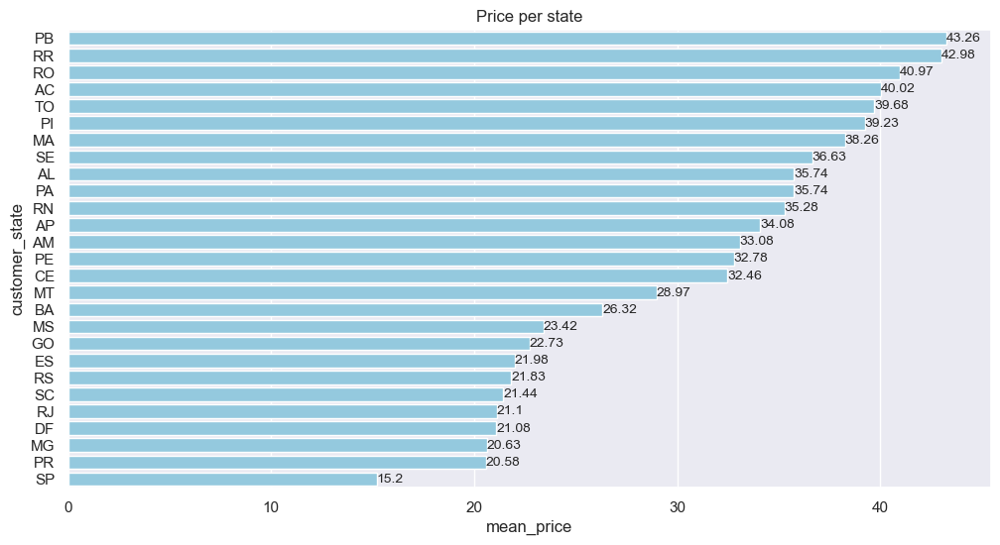

In [143]:
ax = sns.barplot(df_freight_state, y="customer_state", x="mean_price", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10); 
ax.set_title('Price per state');

## 3. Análise de Pagamento

### 3.1 Formas de Pagamento

#### Distribuição dos métodos de pagamento utilizados

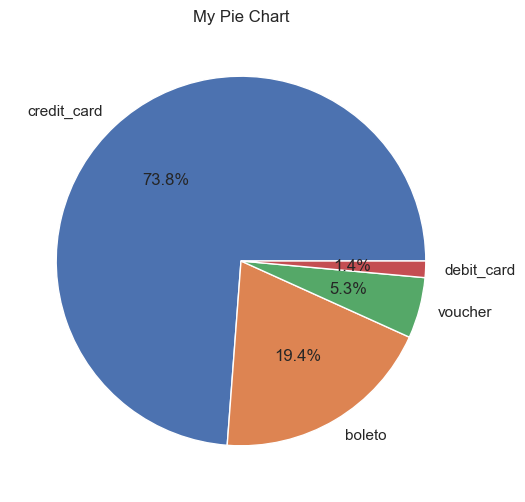

In [149]:
plt.figure(figsize=(6,6))
plt.pie(df_delivered['payment_type'].value_counts(), labels=df_delivered['payment_type'].value_counts().index, autopct='%1.1f%%')
plt.title('My Pie Chart')
plt.show()

In [151]:
df_pay = df_delivered["payment_type"].value_counts().reset_index()
df_pay

,payment_type,count
0,credit_card,84888
1,boleto,22347
2,voucher,6123
3,debit_card,1653


In [153]:
import plotly.express as px
#df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
#df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
fig = px.pie(df_pay, values='count', names='payment_type', title='Population of European continent')
fig.show()

## 4. Análise de Produtos

In [156]:
df_prod_price = df_eda.groupby(['product_id']).agg(price_prod = ('price', 'sum'), n_prod = ('product_id', 'count')).reset_index()

In [158]:
df_prod_price.describe()

,price_prod,n_prod
count,32951.000000,32951.000000
mean,431.219548,3.568966
std,1447.310601,11.007608
min,2.290000,1.000000
25%,60.000000,1.000000
50%,139.900000,1.000000
75%,341.935000,3.000000
max,68485.000000,536.000000


### 4.1 Top 20 Produtos Vendidos (Quantidade)

In [163]:
df_prod_price = df_prod_price.sort_values(by=['n_prod'], ascending = False)

#### Top 20 produtos mais vendidos (head)

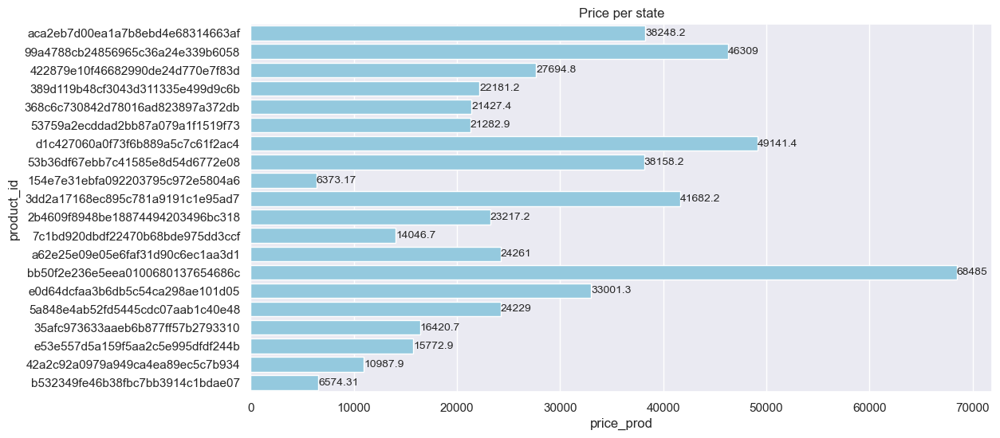

In [167]:
ax = sns.barplot(df_prod_price.head(20), y="product_id", x="price_prod", estimator="sum", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('Price per state');

#### Top 20 produtos menos vendidos (tail)

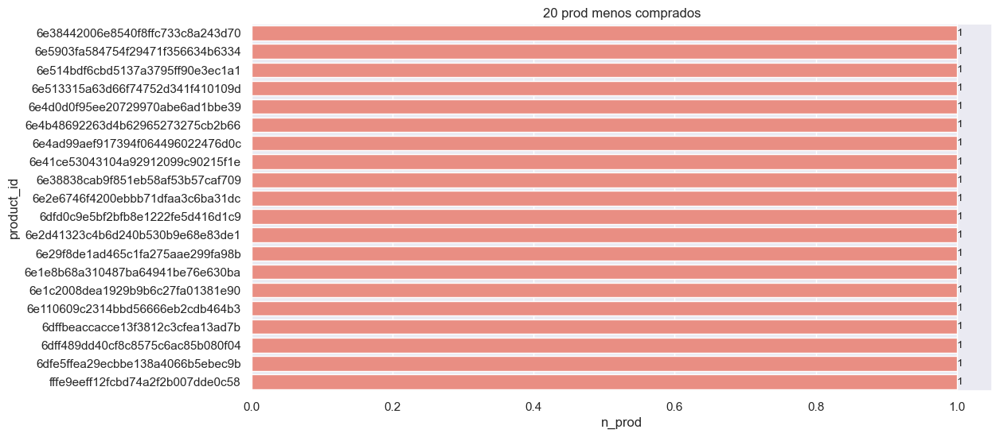

In [172]:
ax = sns.barplot(df_prod_price.tail(20), y="product_id", x="n_prod", estimator="sum", errorbar=None, color='salmon')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('20 prod menos comprados');

### 4.2 Top 20 Produtos Vendidos (Valor Monetário)

In [176]:
df_prod_price = df_prod_price.sort_values(by=['price_prod'], ascending = False)
df_prod_price

,product_id,price_prod,n_prod
24086,bb50f2e236e5eea0100680137654686c,68485.00,209
27613,d6160fb7873f184099d9bc95e30376af,56948.83,41
14068,6cdd53843498f92890544667809f1595,55779.90,159
27039,d1c427060a0f73f6b889a5c7c61f2ac4,49141.40,357
19742,99a4788cb24856965c36a24e339b6058,46308.96,525
...,...,...,...
10782,5304ff3fa35856a156e1170a6022d34d,3.50,1
6086,2e8316b31db34314f393806fd7b6e185,2.99,1
13461,680cc8535be7cc69544238c1d6a83fe8,2.90,1
17767,8a3254bee785a526d548a81a9bc3c9be,2.55,3


#### Top 20 produtos com maior receita

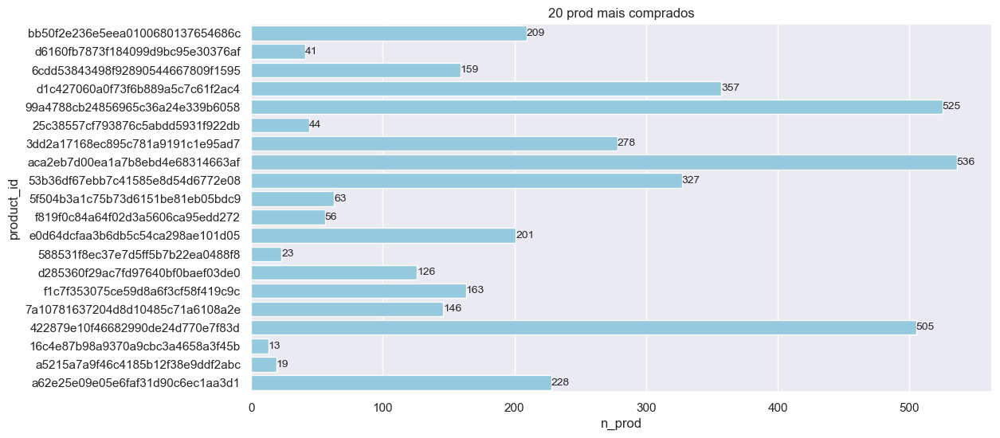

In [180]:
ax = sns.barplot(df_prod_price.head(20), y="product_id", x="n_prod", estimator="sum", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('20 prod mais comprados');

#### Top 20 produtos com menor receita

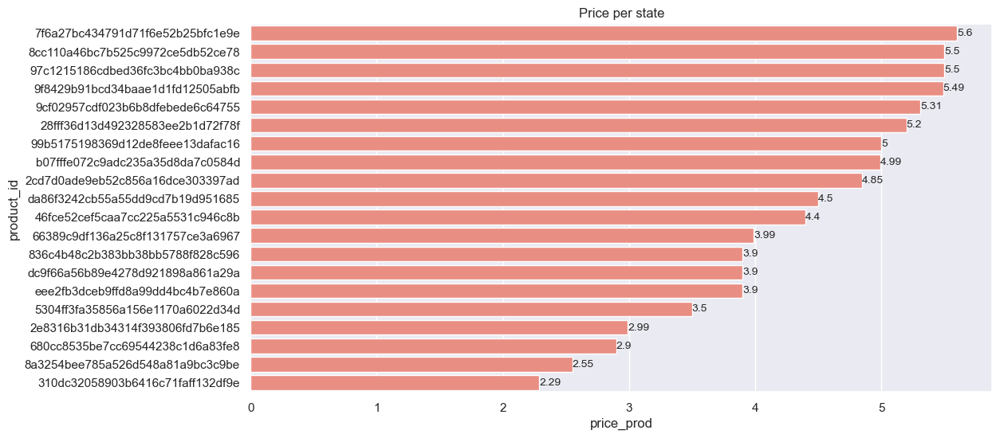

In [184]:
ax = sns.barplot(df_prod_price.tail(20), y="product_id", x="price_prod", estimator="sum", errorbar=None, color='salmon')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('Price per state');

### 4.3 Produtos com Maior Acúmulo de Receita

#### Acúmulo percentual da receita por produto (gráfico de Pareto)

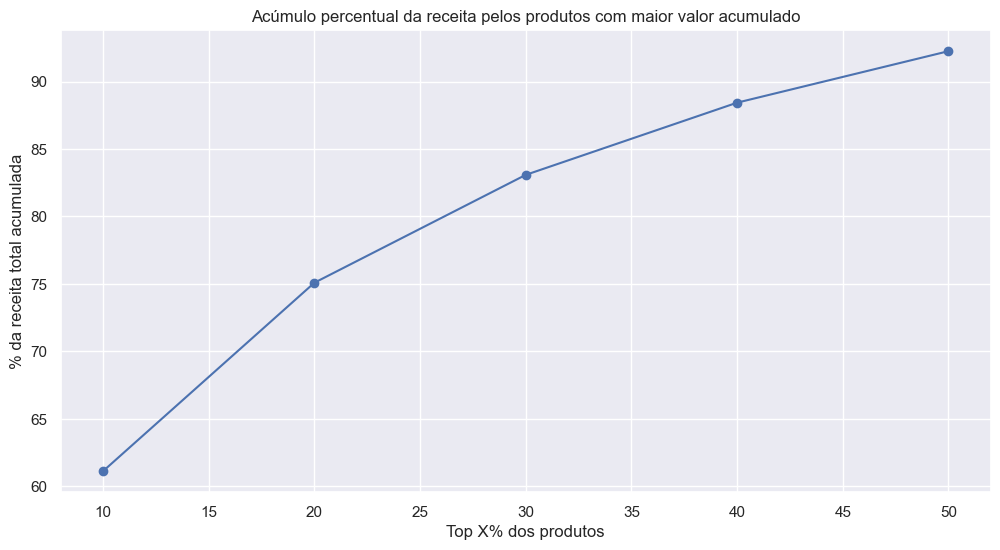

In [189]:
# Transformar isso em funcao. Analisar colocar na axis direita o valor dos preços do minimo ao máximo. noca so do g´rafico, de 60 até 90%
# Função pra fazer especificamente a conta, o grafico não é dificl fazer, mas pensar se faço por causa de ser chato fazer legendas toda hora

df_prod_price['cum_sum'] = df_prod_price['price_prod'].cumsum()
df_prod_price['cum_perc'] = df_prod_price['cum_sum'] / df_prod_price['price_prod'].sum() * 100

percentiles = [10, 20, 30, 40, 50]
index_percentiles = [int(len(df_prod_price) * (p / 100)) for p in percentiles]
perc_values = df_prod_price.iloc[index_percentiles]['cum_perc']

# Plotar
plt.plot(percentiles, perc_values, marker='o')
plt.title('Acúmulo percentual da receita pelos produtos com maior valor acumulado')
plt.xlabel('Top X% dos produtos')
plt.ylabel('% da receita total acumulada')
plt.grid(True)
plt.show()

In [191]:
df_prod_price

,product_id,price_prod,n_prod,cum_sum,cum_perc
24086,bb50f2e236e5eea0100680137654686c,68485.00,209,6.848500e+04,0.481979
27613,d6160fb7873f184099d9bc95e30376af,56948.83,41,1.254338e+05,0.882770
14068,6cdd53843498f92890544667809f1595,55779.90,159,1.812137e+05,1.275334
27039,d1c427060a0f73f6b889a5c7c61f2ac4,49141.40,357,2.303551e+05,1.621179
19742,99a4788cb24856965c36a24e339b6058,46308.96,525,2.766641e+05,1.947089
...,...,...,...,...,...
10782,5304ff3fa35856a156e1170a6022d34d,3.50,1,1.420910e+07,99.999924
6086,2e8316b31db34314f393806fd7b6e185,2.99,1,1.420911e+07,99.999946
13461,680cc8535be7cc69544238c1d6a83fe8,2.90,1,1.420911e+07,99.999966
17767,8a3254bee785a526d548a81a9bc3c9be,2.55,3,1.420911e+07,99.999984


In [193]:
(df_prod_price['price_prod'].head(int(0.04*32951)).sum()/df_prod_price['price_prod'].sum())*100

44.12891541775606

## 5. Análise de Categorias de Produtos

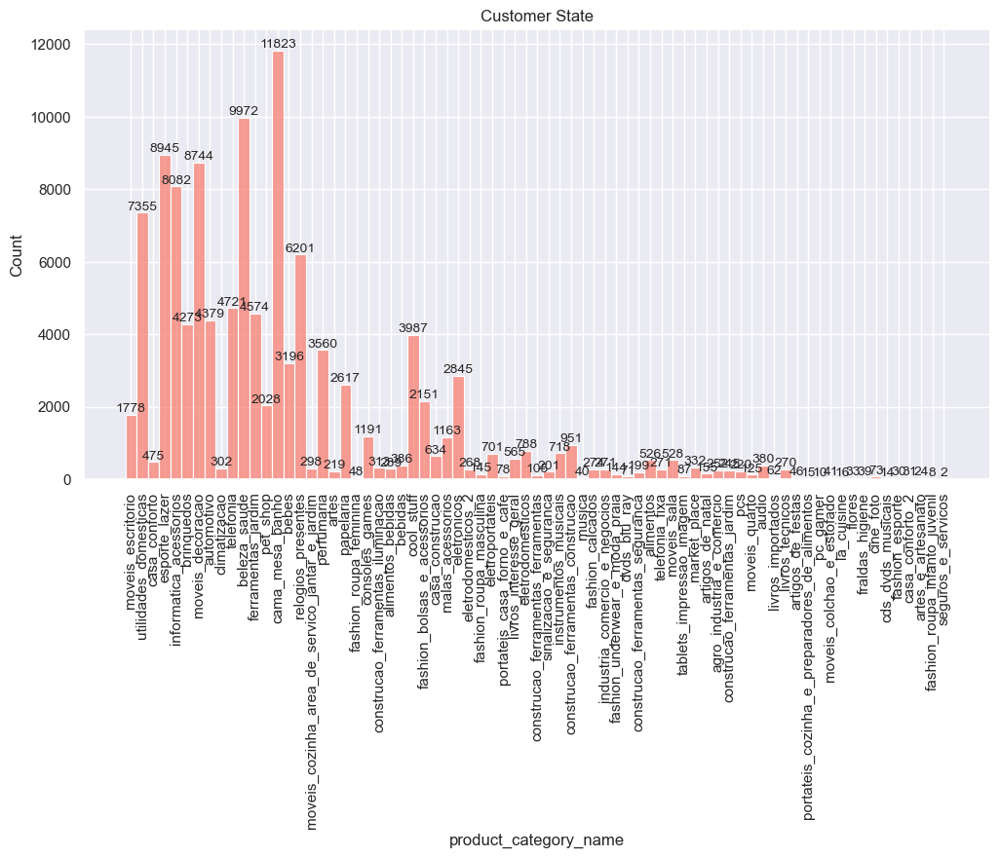

In [199]:
ax = sns.histplot(df_eda['product_category_name'], kde=False, color='salmon')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.tick_params(axis='x', rotation=90)
ax.set_title('Customer State');

### 5.1 Top 20 Categorias por Quantidade

#### Mais vendidas (head)

#### Menos vendidas (tail)

### 5.2 Top 20 Categorias por Receita

In [206]:
df_cat_price = df_eda.groupby(['product_category_name']).agg(price_cat = ('price', 'sum'), n_cat = ('product_category_name', 'count')).reset_index()
df_cat_price = df_cat_price.sort_values(by=['price_cat'], ascending = False)
df_cat_price

,product_category_name,price_cat,n_cat
11,beleza_saude,1297355.80,9972
66,relogios_presentes,1253143.30,6201
13,cama_mesa_banho,1092551.02,11823
32,esporte_lazer,1023996.34,8945
44,informatica_acessorios,942277.57,8082
...,...,...,...
41,flores,1110.04,33
15,casa_conforto_2,773.17,31
17,cds_dvds_musicais,730.00,14
37,fashion_roupa_infanto_juvenil,569.85,8


#### Maior receita (head)

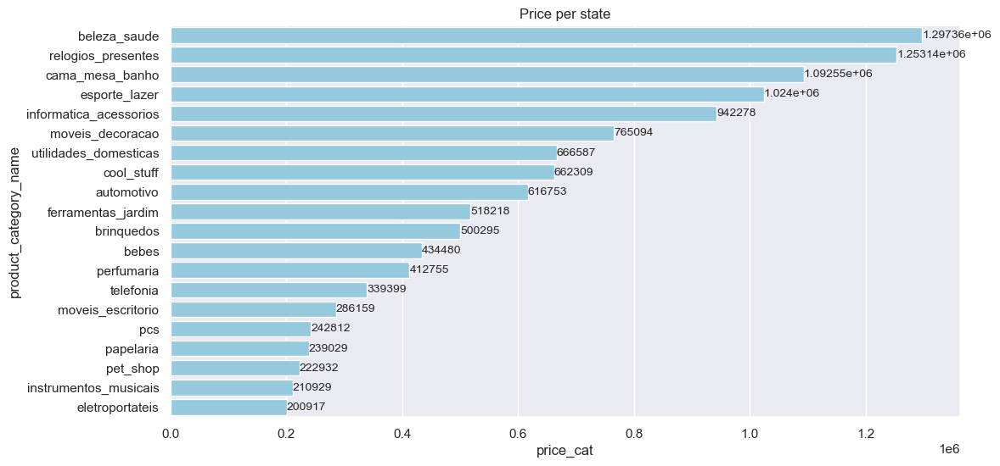

In [210]:
ax = sns.barplot(df_cat_price.head(20), y="product_category_name", x="price_cat", errorbar=None, color='skyblue')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('Price per state');

#### Menor receita (tail)

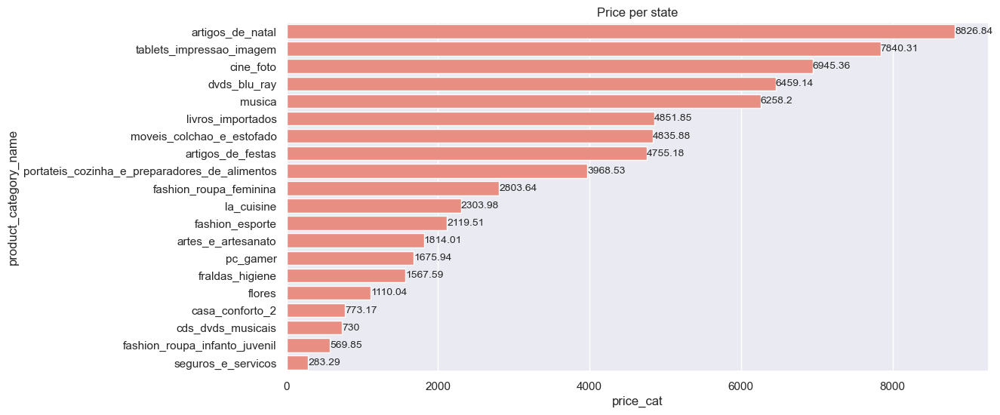

In [214]:
ax = sns.barplot(df_cat_price.tail(20), y="product_category_name", x="price_cat", errorbar=None, color='salmon')
ax.bar_label(ax.containers[0], fontsize=10); # Colocar o ; impede que haja a legenda embaixo. Fantástico
ax.set_title('Price per state');

### 5.3 Acúmulo de Receita por Categoria

#### Acúmulo percentual da receita por categoria

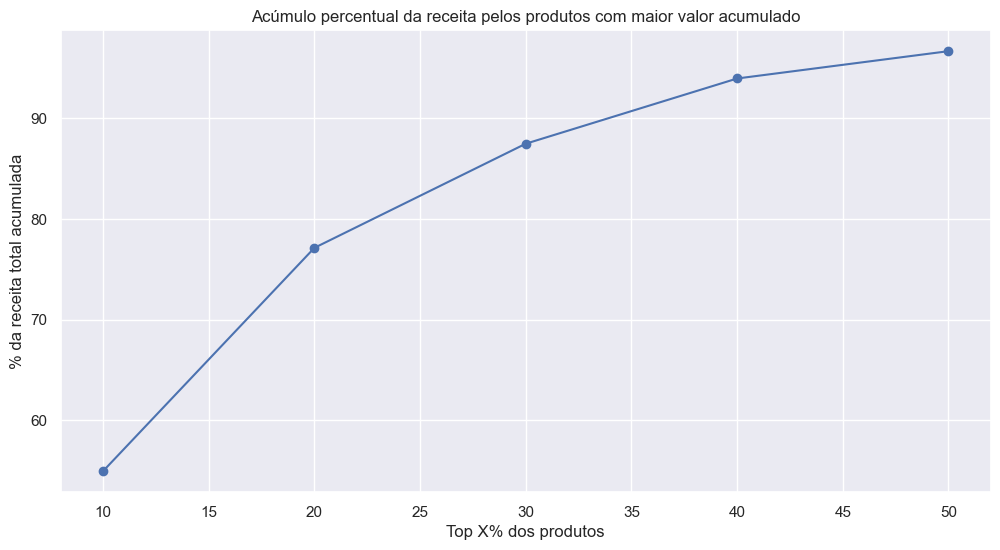

In [219]:
# Transformar isso em funcao. Analisar colocar na axis direita o valor dos preços do minimo ao máximo. noca so do g´rafico, de 60 até 90%
# Função pra fazer especificamente a conta, o grafico não é dificl fazer, mas pensar se faço por causa de ser chato fazer legendas toda hora

df_cat_price['cum_sum'] = df_cat_price['price_cat'].cumsum()
df_cat_price['cum_perc'] = df_cat_price['cum_sum'] / df_cat_price['price_cat'].sum() * 100

percentiles = [10, 20, 30, 40, 50] # usar linespace na função pra separar isso
index_percentiles = [int(len(df_cat_price) * (p / 100)) for p in percentiles]
perc_values = df_cat_price.iloc[index_percentiles]['cum_perc']

# Plotar
plt.plot(percentiles, perc_values, marker='o')
plt.title('Acúmulo percentual da receita pelos produtos com maior valor acumulado')
plt.xlabel('Top X% dos produtos')
plt.ylabel('% da receita total acumulada')
plt.grid(True)
plt.show()

In [222]:
df_cat_price

,product_category_name,price_cat,n_cat,cum_sum,cum_perc
11,beleza_saude,1297355.80,9972,1297355.80,9.254823
66,relogios_presentes,1253143.30,6201,2550499.10,18.194252
13,cama_mesa_banho,1092551.02,11823,3643050.12,25.988079
32,esporte_lazer,1023996.34,8945,4667046.46,33.292864
44,informatica_acessorios,942277.57,8082,5609324.03,40.014699
...,...,...,...,...,...
41,flores,1110.04,33,14015802.44,99.983191
15,casa_conforto_2,773.17,31,14016575.61,99.988707
17,cds_dvds_musicais,730.00,14,14017305.61,99.993914
37,fashion_roupa_infanto_juvenil,569.85,8,14017875.46,99.997979


In [225]:
(df_cat_price['price_cat'].head(int(0.50*len(df_cat_price))).sum()/df_cat_price['price_cat'].sum())*100

96.3083810846414

## 6. Análise Temporal

### 6.1 Visão Geral Mensal

#### Valores totais por mês e ano (R$)

In [232]:
df_test = df_eda.groupby(['year_order', 'month_order','month_order_n']).agg(total_price = ('price', 'sum'), avg_price = ('price', 'mean'))

# df_test = df_test.sort_values(by=['month_order_n','year_order'])
df_test

total_price   avg_price
year_order month_order month_order_n                         
2016       December    12                   10.90   10.900000
           October     10                50942.23  133.706640
           September   09                  132.39   44.130000
2017       April       04               391784.42  137.227468
           August      08               601409.67  116.326822
           December    12               770656.15  117.406482
           February    02               260753.86  126.456770
           January     01               128637.99  127.998000
           July        07               533616.84  110.251413
           June        06               453031.41  119.817882
           March       03               396451.04  124.630946
           May         05               545340.65  124.053833
           November    11              1046127.84  116.030151
           October     10               693807.60  124.561508
           September   09               662276.39  129.883583
2018       April       04              1029472.30  124.618363
           August      08               884657.40  118.554999
           February    02               880099.79  111.095656
           January     01               987151.41  115.523863
           July        07               925302.46  126.217768
           June        06               909221.10  123.033978
           March       03              1025936.06  120.076786
           May         05              1032150.44  125.550473
           September   09                  145.00  145.000000

In [234]:
month_order_n

NameError: name 'month_order_n' is not defined

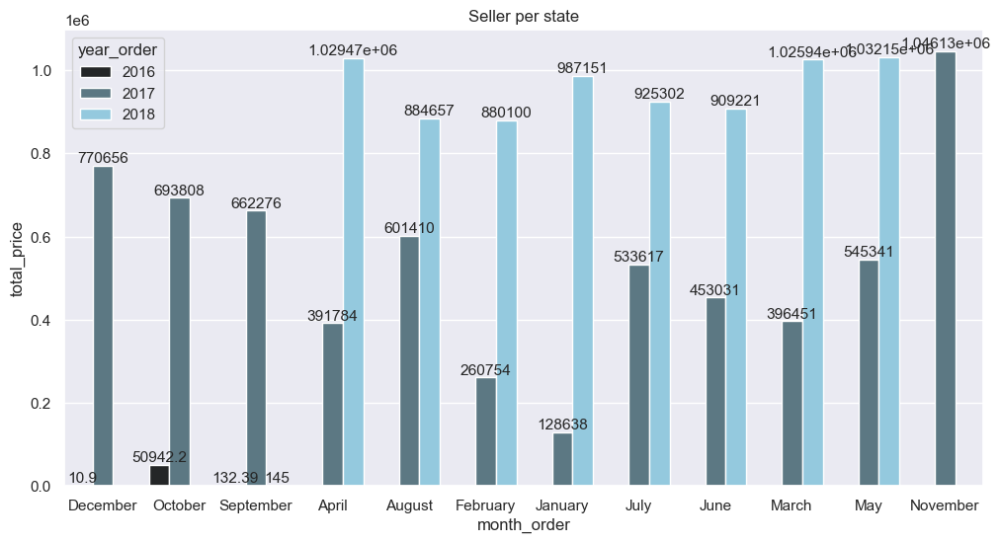

In [237]:
ax = sns.barplot(data = df_test, y='total_price', x="month_order", hue = 'year_order', errorbar=None, palette='dark:skyblue')
ax.bar_label(ax.containers[0], fontsize=11.2);
ax.bar_label(ax.containers[1], fontsize=11.2);
ax.bar_label(ax.containers[2], fontsize=11.2);
#ax.tick_params(axis='x', rotation=90)
ax.set_title('Seller per state');

#### Quantidade total de pedidos por mês e ano

In [241]:
df_test2 = df_eda.groupby(['year_order', 'month_order']).agg(n_orders = ('customer_id', 'count'))
df_test2

n_orders
year_order month_order          
2016       December            1
           October           381
           September           3
2017       April            2855
           August           5170
           December         6564
           February         2062
           January          1005
           July             4840
           June             3781
           March            3181
           May              4396
           November         9016
           October          5570
           September        5099
2018       April            8261
           August           7462
           February         7922
           January          8545
           July             7331
           June             7390
           March            8544
           May              8221
           September           1

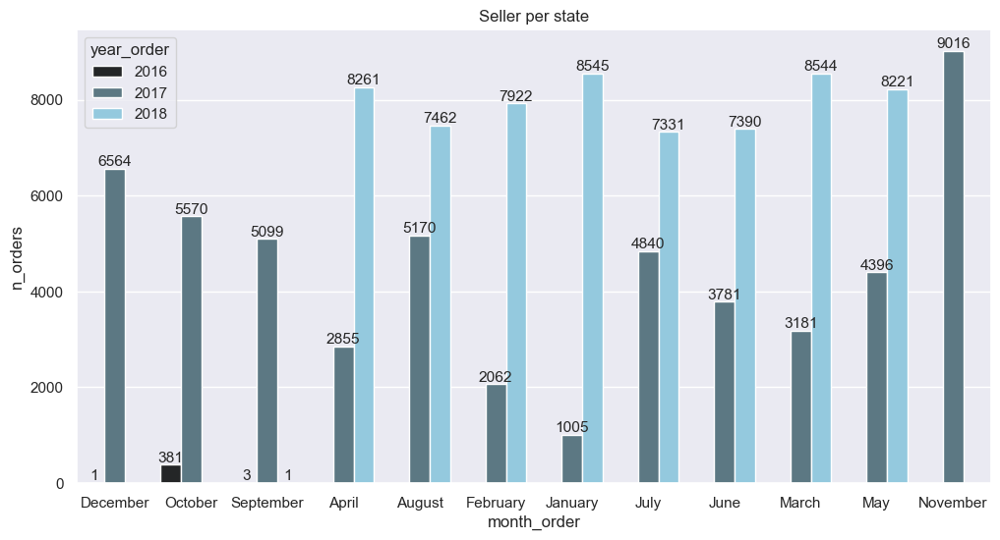

In [243]:
ax = sns.barplot(data = df_test2, y='n_orders', x="month_order", hue = 'year_order', errorbar=None, palette='dark:skyblue')
ax.bar_label(ax.containers[0], fontsize=11.2);
ax.bar_label(ax.containers[1], fontsize=11.2);
ax.bar_label(ax.containers[2], fontsize=11.2);
#ax.tick_params(axis='x', rotation=90)
ax.set_title('Seller per state');

### 6.2 Evolução Temporal dos Produtos

#### Top 10 produtos × tempo (quantidade)

In [248]:
df_prod_price = df_prod_price.sort_values(by=['price_prod'], ascending = False)
top_prod = df_prod_price['product_id'].head(10).values.tolist()

In [250]:
df_prod_mask = df_delivered[['product_id','order_approved_at','price']]
df_prod = df_prod_mask[df_prod_mask['product_id'].isin(top_prod)]
df_prod

,product_id,order_approved_at,price
18,99a4788cb24856965c36a24e339b6058,2017-05-13 11:55:16,89.9
19,99a4788cb24856965c36a24e339b6058,2017-05-13 11:55:16,89.9
57,3dd2a17168ec895c781a9191c1e95ad7,2018-01-31 13:32:04,149.9
98,bb50f2e236e5eea0100680137654686c,2018-06-07 21:54:43,330.0
99,bb50f2e236e5eea0100680137654686c,2018-06-07 21:54:43,330.0
...,...,...,...
117286,aca2eb7d00ea1a7b8ebd4e68314663af,2018-01-12 21:54:22,69.9
117396,d1c427060a0f73f6b889a5c7c61f2ac4,2018-05-03 19:33:56,119.0
117407,5f504b3a1c75b73d6151be81eb05bdc9,2017-09-21 14:44:43,610.0
117428,d1c427060a0f73f6b889a5c7c61f2ac4,2018-01-23 15:37:23,149.0


In [252]:
df_prod = df_prod.sort_values(by=['product_id', 'order_approved_at'])

df_prod['cumulative_price'] = df_prod.groupby('product_id')['price'].cumsum()
df_prod['cumulative_count'] = df_prod.groupby('product_id').cumcount() + 1

In [254]:
df_prod

,product_id,order_approved_at,price,cumulative_price,cumulative_count
61382,25c38557cf793876c5abdd5931f922db,2017-12-11 19:50:14,1009.00,1009.00,1
110079,25c38557cf793876c5abdd5931f922db,2017-12-20 07:18:28,1009.00,2018.00,2
111357,25c38557cf793876c5abdd5931f922db,2017-12-20 17:31:14,1009.00,3027.00,3
30274,25c38557cf793876c5abdd5931f922db,2018-01-03 13:27:55,1009.00,4036.00,4
107080,25c38557cf793876c5abdd5931f922db,2018-01-11 14:09:24,1009.00,5045.00,5
...,...,...,...,...,...
8824,d6160fb7873f184099d9bc95e30376af,2017-10-03 14:07:33,1599.99,47598.88,35
46901,d6160fb7873f184099d9bc95e30376af,2017-10-03 20:25:04,1599.99,49198.87,36
96979,d6160fb7873f184099d9bc95e30376af,2017-10-05 18:25:22,1599.99,50798.86,37
103412,d6160fb7873f184099d9bc95e30376af,2017-10-06 19:07:08,1599.99,52398.85,38


<Axes: xlabel='order_approved_at', ylabel='cumulative_count'>

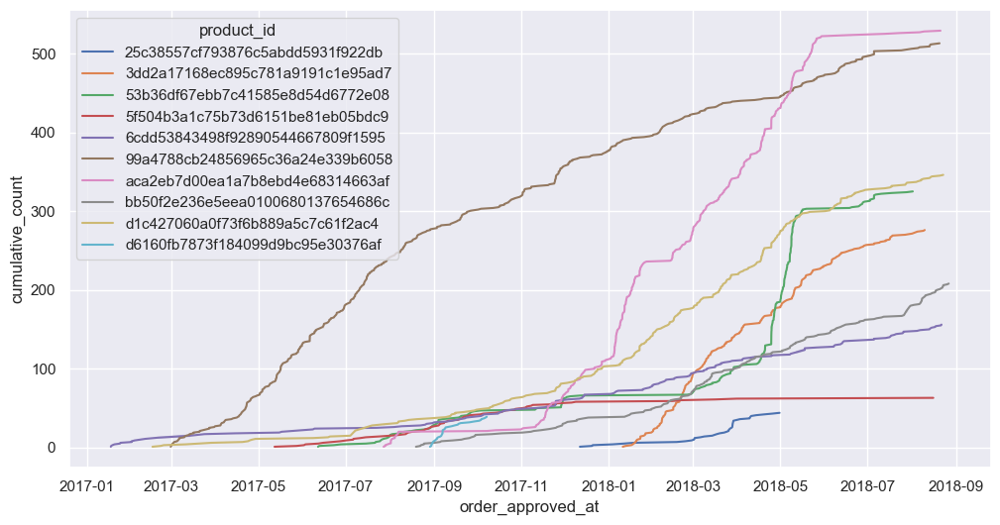

In [256]:
sns.lineplot(data=df_prod, x="order_approved_at", y="cumulative_count", hue="product_id")

#### Top 10 produtos × tempo (valor monetário)

<Axes: xlabel='order_approved_at', ylabel='cumulative_price'>

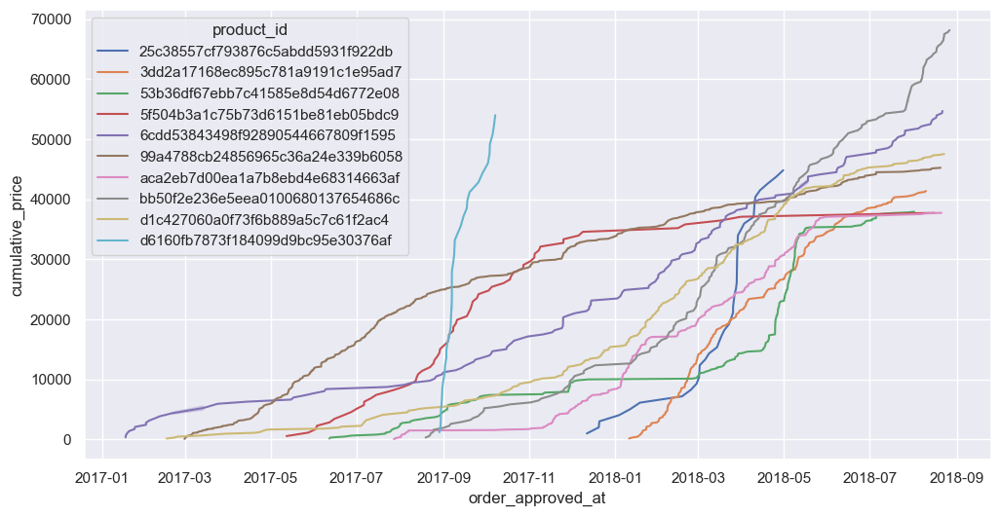

In [259]:
sns.lineplot(data=df_prod, x="order_approved_at", y="cumulative_price", hue="product_id")

### 6.3 Evolução Temporal das Categorias

#### Top 10 categorias × tempo (quantidade)

In [262]:
df_cat_price = df_cat_price.sort_values(by=['price_cat'], ascending = False)
top_cat = df_cat_price['product_category_name'].head(10).values.tolist()

In [263]:
df_cat_mask = df_delivered[['product_category_name','order_approved_at','price']]
df_cat = df_cat_mask[df_cat_mask['product_category_name'].isin(top_cat)]
df_cat

,product_category_name,order_approved_at,price
1,utilidades_domesticas,2018-01-12 20:58:32,289.00
5,esporte_lazer,2017-09-14 18:25:11,259.90
6,informatica_acessorios,2018-02-19 14:50:37,14.99
9,moveis_decoracao,2018-01-08 11:35:27,99.90
10,automotivo,2017-11-27 18:01:20,25.30
...,...,...,...
117594,relogios_presentes,2018-05-18 21:55:14,124.90
117595,utilidades_domesticas,2017-12-18 00:17:27,55.00
117597,esporte_lazer,2018-04-04 08:35:12,114.90
117598,beleza_saude,2018-04-08 20:30:03,37.00


In [264]:
df_cat = df_cat.sort_values(by=['product_category_name', 'order_approved_at'])

df_cat['cumulative_price'] = df_cat.groupby('product_category_name')['price'].cumsum()
df_cat['cumulative_count'] = df_cat.groupby('product_category_name').cumcount() + 1

In [265]:
df_cat

,product_category_name,order_approved_at,price,cumulative_price,cumulative_count
15031,automotivo,2016-10-04 13:26:11,9.90,9.90,1
89463,automotivo,2016-10-06 03:07:51,10.00,19.90,2
103251,automotivo,2016-10-06 15:44:26,294.90,314.80,3
81709,automotivo,2016-10-06 15:49:04,499.99,814.79,4
43348,automotivo,2016-10-06 16:02:42,49.99,864.78,5
...,...,...,...,...,...
100750,utilidades_domesticas,2018-08-29 03:10:17,65.00,648084.05,7168
96732,utilidades_domesticas,2018-08-29 03:15:36,17.90,648101.95,7169
96733,utilidades_domesticas,2018-08-29 03:15:36,17.90,648119.85,7170
96734,utilidades_domesticas,2018-08-29 03:15:36,17.90,648137.75,7171


<Axes: xlabel='order_approved_at', ylabel='cumulative_price'>

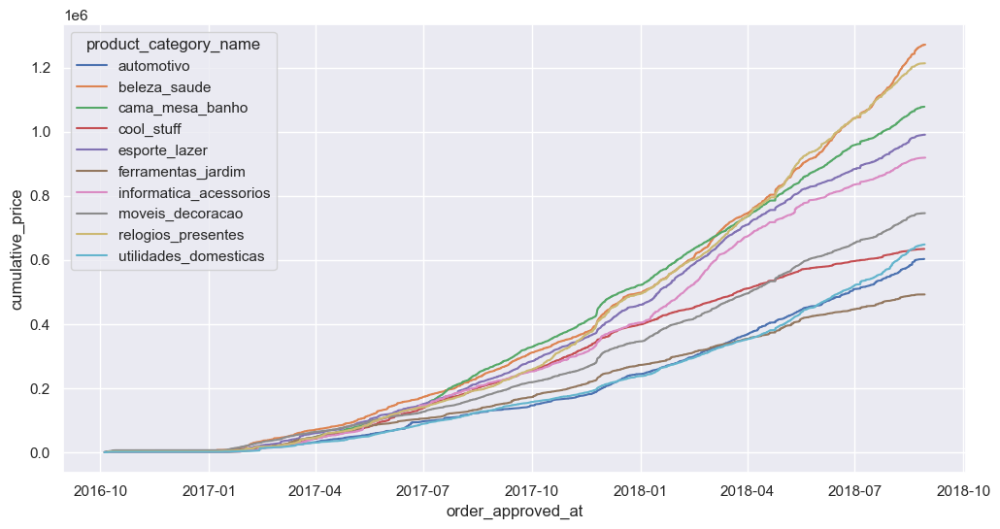

In [266]:
sns.lineplot(data=df_cat, x="order_approved_at", y="cumulative_price", hue="product_category_name")

#### Top 10 categorias × tempo (valor monetário)

<Axes: xlabel='order_approved_at', ylabel='cumulative_count'>

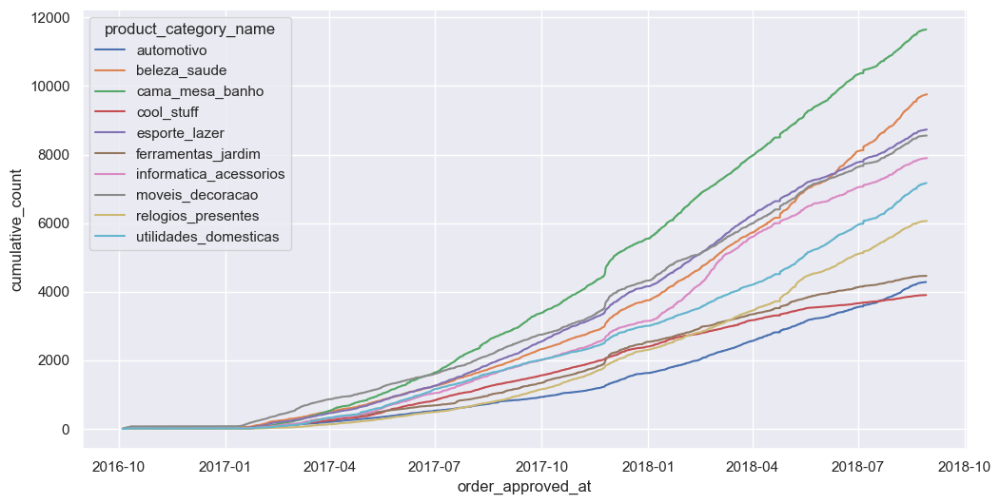

In [269]:
sns.lineplot(data=df_cat, x="order_approved_at", y="cumulative_count", hue="product_category_name")

#### Top 10 categorias × mês (quantidade)

In [285]:
df_cat_month = df_eda.groupby(['month_order','month_order_n','product_category_name']
                             ).agg(price_cat = ('price', 'sum'), n_cat = ('product_category_name', 'count')
                                  ).sort_values(by=['month_order_n'], ascending = True)
df_cat_month

price_cat  n_cat
month_order month_order_n product_category_name                               
January     01            construcao_ferramentas_iluminacao     2392.99      7
                          construcao_ferramentas_construcao    10805.98     51
                          construcao_ferramentas_ferramentas     532.30      8
                          construcao_ferramentas_jardim         3961.88     25
                          construcao_ferramentas_seguranca      2228.89     11
...                                                                 ...    ...
December    12            fashion_underwear_e_moda_praia        1173.10     13
                          fashion_roupa_masculina                450.89      4
                          fashion_esporte                         59.90      1
                          moveis_colchao_e_estofado             1052.70      9
                          telefonia_fixa                         998.77      5

[806 rows x 2 columns]

In [293]:
def month_analysis(df, months, col_filter, col_analysis, analysis, n_val):

    '''
    function to plot graphs of the designated columns by the chosen months
    
    args:
        df(DataFrame):
        months(string list):
        col_filter(string):
        col_analysis(string):
        analysis(string):
        n_val(int):
    
    '''
    fig, axes = plt.subplots(len(months), 1, figsize=(5 * len(months), 8))

    
    for i, month in enumerate(months):
        df_analysis = df[df[col_filter] == month].sort_values(by=[analysis], ascending = False).head(n_val)
        # print(df_analysis)
        # print("\n")
    
        sns.barplot(df_analysis, y = col_analysis,  x = analysis, errorbar = None, color = 'skyblue', ax = axes[i])
        axes[i].set_title(f'{month}')

    plt.tight_layout()
    plt.show()
    
    return(None)

In [314]:
df_cat_month = df_cat_month.reset_index()

In [316]:
df_cat_month[df_cat_month['month_order'] == 'April'].sort_values(by=['price_cat'], ascending = False).head(10)

,month_order,month_order_n,product_category_name,price_cat,n_cat
222,April,04,relogios_presentes,125385.52,636
240,April,04,beleza_saude,116087.10,897
238,April,04,cama_mesa_banho,102091.15,1082
236,April,04,esporte_lazer,94233.21,837
218,April,04,moveis_decoracao,82868.71,843
208,April,04,informatica_acessorios,81406.51,692
204,April,04,ferramentas_jardim,68173.39,450
244,April,04,automotivo,67615.58,464
269,April,04,utilidades_domesticas,62328.54,684
261,April,04,cool_stuff,59576.56,342


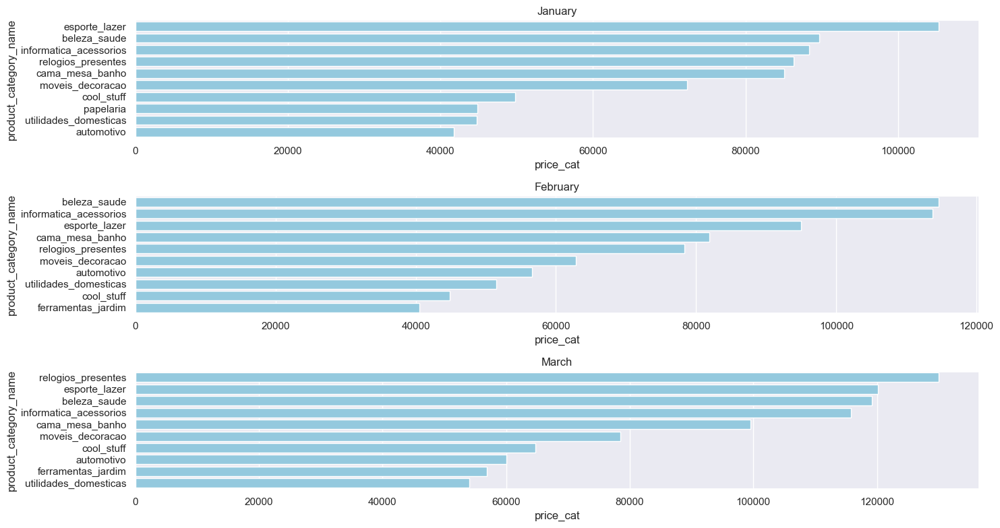

In [318]:
month_analysis(df = df_cat_month, months = ['January', 'February', 'March'], col_filter = 'month_order', 
               col_analysis = 'product_category_name', analysis = 'price_cat', n_val = 10)

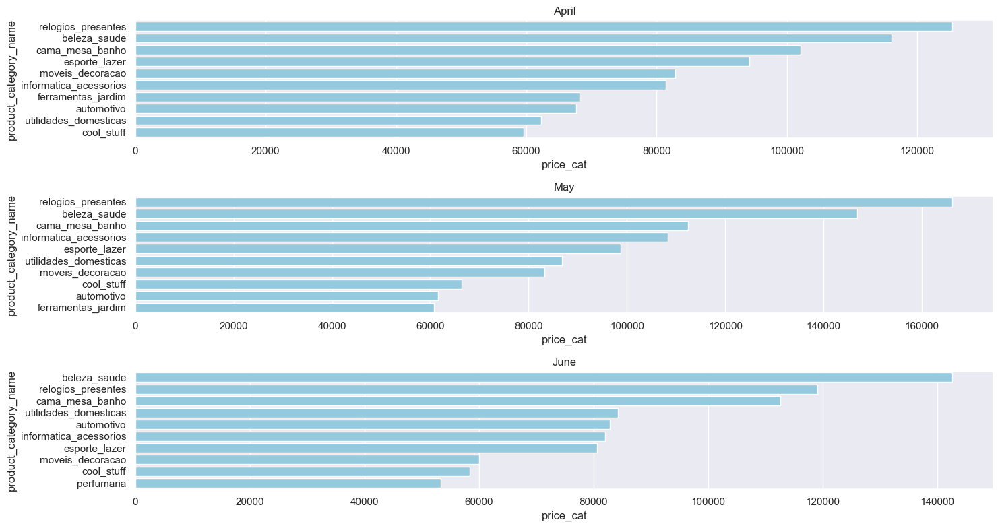

In [320]:
month_analysis(df = df_cat_month, months = ['April', 'May', 'June'], col_filter = 'month_order',
               col_analysis = 'product_category_name', analysis = 'price_cat', n_val = 10)

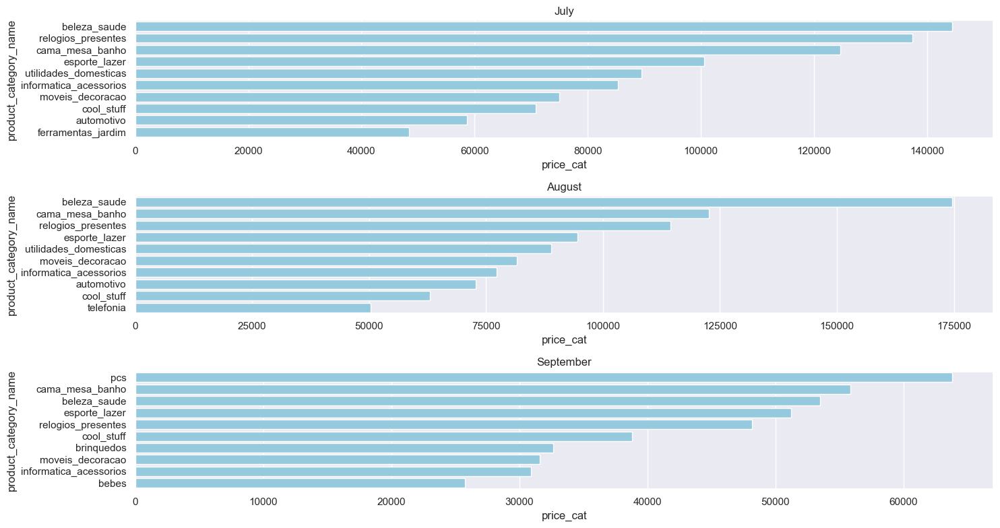

In [321]:
month_analysis(df = df_cat_month, months = ['July', 'August', 'September'], col_filter = 'month_order',
               col_analysis = 'product_category_name', analysis = 'price_cat', n_val = 10)

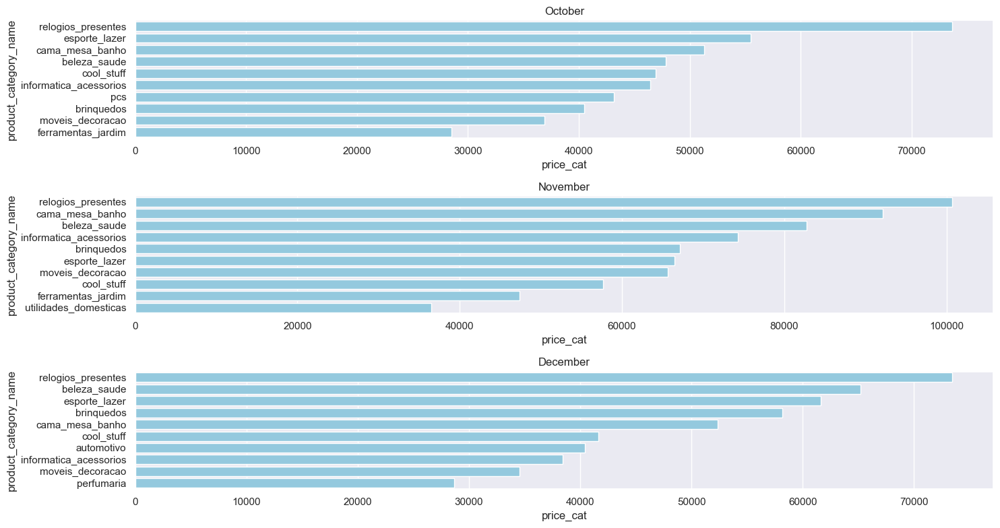

In [322]:
month_analysis(df = df_cat_month, months = ['October', 'November', 'December'], col_filter = 'month_order',
               col_analysis = 'product_category_name', analysis = 'price_cat', n_val = 10)

### 6.4 Análise de tempo de ordens

In [328]:
df_order_time = pd.DataFrame()
df_order_time['purchased_approved'] = df_delivered['order_approved_at'] - df_delivered['order_purchase_timestamp'] # diferença entre comprovação do pagamento e aceitamento da compra
df_order_time['purchased_carrier'] = df_delivered['order_delivered_carrier_date'] - df_delivered['order_purchase_timestamp'] # diferença de tepmo entre  pagamento e ordem entrega ao transporte logistico
df_order_time['purchased_customer'] = df_delivered['order_delivered_customer_date'] - df_delivered['order_purchase_timestamp'] # diferença de tempo entre pagamento e entrega ao cliente

df_order_time['estimated_delivered'] = df_delivered['order_delivered_customer_date'] - df_delivered['order_estimated_delivery_date'] # diferença de entrega atual e estimada
df_order_time['estimated_shipping'] = df_delivered['order_delivered_carrier_date'] - df_delivered['shipping_limit_date'] # Diferença entre tempo de entrega ao transportador real e estiamdo

In [330]:
df_order_time.describe()

,purchased_approved,purchased_carrier,purchased_customer,estimated_delivered,estimated_shipping
count,115011,115011,115011,115011,115011
mean,0 days 10:25:52.716905339,3 days 06:46:27.134239333,12 days 11:35:25.914982045,-12 days +15:44:09.094156212,-4 days +16:17:29.870777578
std,0 days 20:56:20.477384153,3 days 15:30:44.617405560,9 days 10:51:44.878696848,10 days 03:53:45.095109380,5 days 17:59:25.815322249
min,0 days 00:00:00,-172 days +18:54:07,0 days 12:48:07,-147 days +23:36:47,-1047 days +03:28:20
25%,0 days 00:12:57,1 days 03:17:32.500000,6 days 17:56:33.500000,-17 days +16:27:42.500000,-6 days +19:13:20.500000
50%,0 days 00:20:48,2 days 05:29:02,10 days 04:42:27,-13 days +22:40:08,-4 days +18:48:00
75%,0 days 14:55:10,4 days 02:46:12,15 days 12:58:46,-7 days +11:59:59.500000,-2 days +11:07:03.500000
max,30 days 21:26:37,125 days 18:36:45,209 days 15:05:12,188 days 23:24:07,116 days 18:18:06


Observamos uma grande quantidade de outliers. Removeremos então os maiores e menores 5% (o valor que sobrará será entre 5% < x < 95%):

Não dá certo. Preciso fazer isso pra cada uma das amostras, tá muito ruim em algumas partes;

In [333]:
df_order_time['purchased_approved'] = df_order_time['purchased_approved'].clip(upper=df_order_time['purchased_approved'].quantile(0.97))

df_order_time['purchased_carrier'] = df_order_time['purchased_carrier'].clip(lower=df_order_time['purchased_carrier'].quantile(0.03), 
                                                                              upper=df_order_time['purchased_carrier'].quantile(0.97))

df_order_time['purchased_customer'] = df_order_time['purchased_customer'].clip(upper=df_order_time['purchased_customer'].quantile(0.97))

df_order_time['estimated_delivered'] = df_order_time['estimated_delivered'].clip(lower=df_order_time['estimated_delivered'].quantile(0.03), 
                                                                                upper=df_order_time['estimated_delivered'].quantile(0.97))

df_order_time['estimated_shipping'] = df_order_time['estimated_shipping'].clip(lower=df_order_time['estimated_shipping'].quantile(0.03), 
                                                                               upper=df_order_time['estimated_shipping'].quantile(0.97))

In [335]:
df_order_time.describe()

,purchased_approved,purchased_carrier,purchased_customer,estimated_delivered,estimated_shipping
count,115011,115011,115011,115011,115011
mean,0 days 09:36:54.057613619,3 days 02:27:44.547301562,12 days 02:38:31.850826442,-12 days +12:16:51.814328195,-4 days +15:30:28.913522185
std,0 days 16:41:36.471221053,2 days 15:21:44.419669732,7 days 14:58:45.882826918,8 days 01:31:02.923419501,2 days 13:41:20.267259949
min,0 days 00:00:00,0 days 07:09:42.599999999,0 days 12:48:07,-29 days +08:43:34,-10 days +19:59:45.700000
25%,0 days 00:12:57,1 days 03:17:32.500000,6 days 17:56:33.500000,-17 days +16:27:42.500000,-6 days +19:13:20.500000
50%,0 days 00:20:48,2 days 05:29:02,10 days 04:42:27,-13 days +22:40:08,-4 days +18:48:00
75%,0 days 14:55:10,4 days 02:46:12,15 days 12:58:46,-7 days +11:59:59.500000,-2 days +11:07:03.500000
max,2 days 16:29:11.199999999,11 days 17:10:00.099999999,34 days 07:12:32.399999999,7 days 19:57:38.700000,2 days 07:45:11.399999999


In [337]:
def plot_boxplots(df, columns = None, time = None):
    """
    generates boxplots for the selected columns in a Pandas DataFrame.

    args:
        df (pd.DataFrame): The input DataFrame.
    """
    
    if columns:
        df = df[columns]


    if time == 'days': # funciona
        df = df.apply(lambda x: x.dt.days)
    elif time == 'seconds': # funciona
        df = df.apply(lambda x: x.dt.seconds)
    elif time == 'minutes':
        df = df.apply(lambda x: x.dt.seconds/60)
        
    elif time == 'hours':
        df = df.apply(lambda x: x.dt.seconds/3600)
    
    
    n_cols = len(df.columns)
    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 10))

    
    if n_cols < 2:
        for i, column in enumerate(df.columns):
            sns.boxplot(y=df[column])
            axes.set_title(f'Boxplot of {column} in {time}')
    else:
        for i, column in enumerate(df.columns):
          sns.boxplot(y=df[column], ax=axes[i])
          axes[i].set_title(f'Boxplot of {column} in {time}')

    plt.tight_layout()
    plt.show()
    return (None)

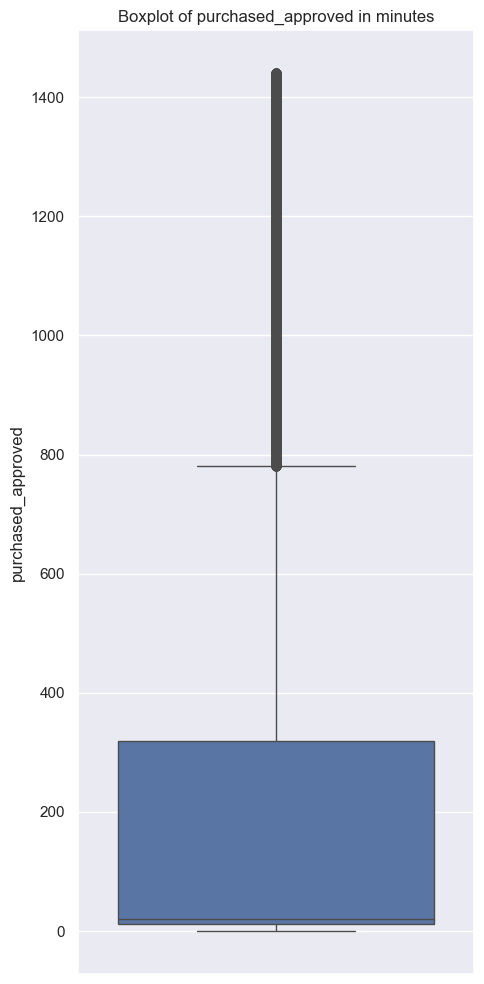

In [339]:
plot_boxplots(df = df_order_time, columns = ['purchased_approved'], time = 'minutes')

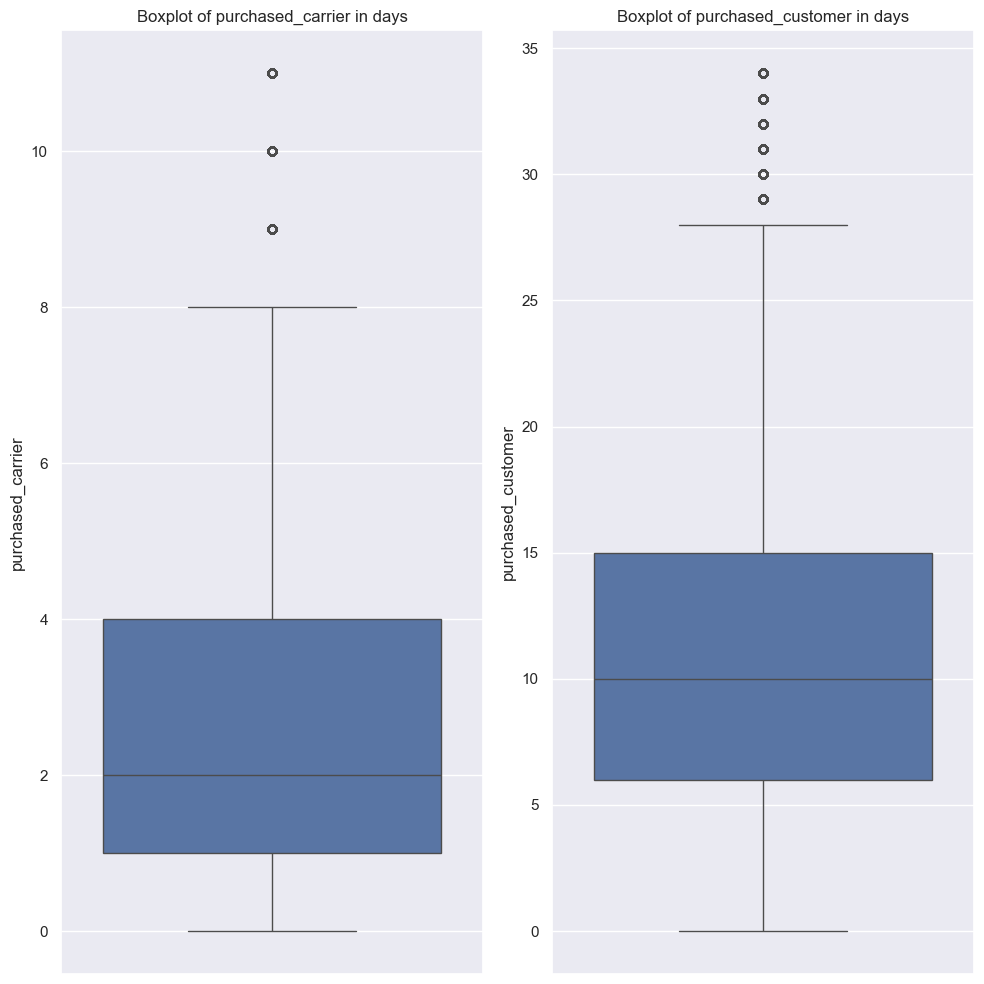

In [341]:
plot_boxplots(df = df_order_time, columns = ['purchased_carrier', 'purchased_customer'], time = 'days')

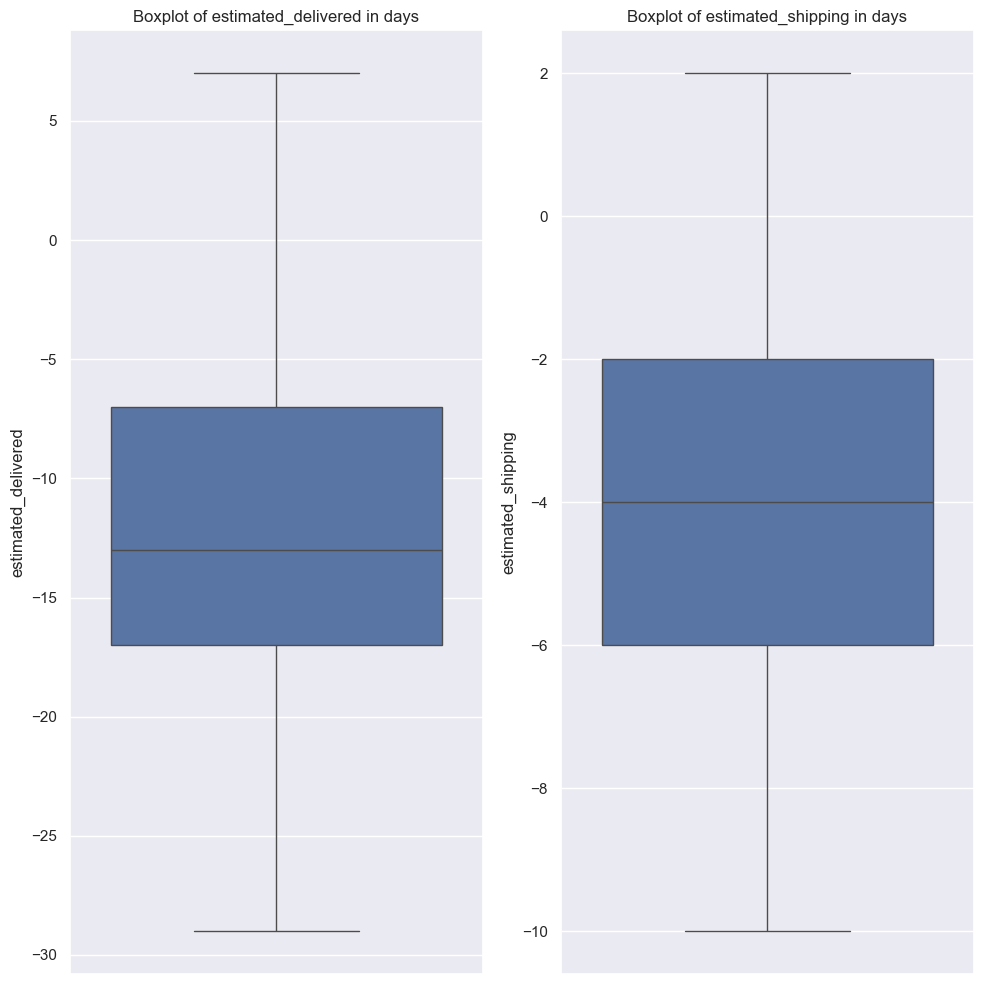

In [342]:
plot_boxplots(df = df_order_time, columns = ['estimated_delivered', 'estimated_shipping'], time = 'days')